In [1]:
seed <- 124
set.seed(seed)
options(ggrepel.max.overlaps=100)

suppressPackageStartupMessages({
    library(magrittr)
    library(dplyr)
    library(purrr)
    library(tidyverse)

    library(ggplot2)
    theme_set(theme_bw() + theme())
    library(patchwork)

    library(SingleCellExperiment)
    library(multisce)
    library(scutility)
    library(scran)
    library(BiocParallel)
    
    library(anndata)
    library(reticulate)
})


use_condaenv(condaenv='scvi-tools', required=TRUE)
sc <- import('scanpy', convert = FALSE)
anndata <- import('anndata', convert = FALSE)
pd <- import('pandas', convert = FALSE)

In [2]:
adata <- anndata::read_h5ad(here::here("data", "adata", "skin_Tcell_scANVI.h5ad"))
adata

AnnData object with n_obs × n_vars = 79021 × 1000
    obs: 'run', 'sum', 'detected', 'subsets_Mito_sum', 'subsets_Mito_detected', 'subsets_Mito_percent', 'total', 'sizeFactor', 'louvain', 'cluster', 'label', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'Doublet_cluster', 'doublet', 'dead_cell', 'cc_phase', 'cc_score_S', 'cc_score_G2M', 'ann_singleR_encode', 'cell_type_singleR_encode', 'ann_singleR_HCA', 'cell_type_singleR_HCA', 'cell_type', 'sample', 'tissue', 'study', 'donor', 'TRA.1.v_gene', 'TRA.1.d_gene', 'TRA.1.j_gene', 'TRA.1.c_gene', 'TRA.1.cdr3', 'TRA.1.cdr3_nt', 'TRA.1.umis', 'TRA.1.reads', 'TRA.1.high_confidence', 'TRA.1.productive', 'TRA.1.full_length', 'TRA.1.raw_clonotype_id', 'TRA.2.v_gene', 'TRA.2.d_gene', 'TRA.2.j_gene', 'TRA.2.c_gene', 'TRA.2.cdr3', 'TRA.2.cdr3_nt', 'TRA.2.umis', 'TRA.2.reads', 'TRA.2.high_confidence', 'TRA.2.productive', 'TRA.2.full_length', 'TRA.2.raw_clonotype_id', 'TRB.1.v_gene', 'TRB.1.d_gene', 'TRB.1

In [3]:
sce <- multisce_load(path=here::here("data", "multisce", "all"), main_name="RNA", reduceddim_include=c())
sce %<>% .[, rownames(adata)]
sce

Loading RNA from /home/tbb/git/CTCL_KC_HLAII/data/multisce/all/sce/RNA.rds

Loading coldata from /home/tbb/git/CTCL_KC_HLAII/data/multisce/all/coldata.rds



class: SingleCellExperiment 
dim: 36601 79021 
metadata(1): multisce_path
assays(2): counts logcounts
rownames(36601): MIR1302-2HG FAM138A ... AC007325.4 AC007325.2
rowData names(0):
colnames(79021): AAACGGGCACACATGT-1_1 AAACGGGTCGGATGTT-1_1 ...
  TTTGTCAGTGCTCTTC-1_39 TTTGTCATCCGTAGGC-1_39
colData names(193): run sum ... age sex
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [4]:
sce <- scutility::scVI_load(adata=adata, sce=sce[, rownames(adata)], reducedDim_include=c("X_scANVI", "X_umap", "X_scVI"))
sce

class: SingleCellExperiment 
dim: 36601 79021 
metadata(1): multisce_path
assays(2): counts logcounts
rownames(36601): MIR1302-2HG FAM138A ... AC007325.4 AC007325.2
rowData names(0):
colnames(79021): AAACGGGCACACATGT-1_1 AAACGGGTCGGATGTT-1_1 ...
  TTTGTCAGTGCTCTTC-1_39 TTTGTCATCCGTAGGC-1_39
colData names(204): run sum ... leiden_scANVI_15 leiden_scANVI_20
reducedDimNames(3): scANVI umap scVI
mainExpName: RNA
altExpNames(1): VI_RNA

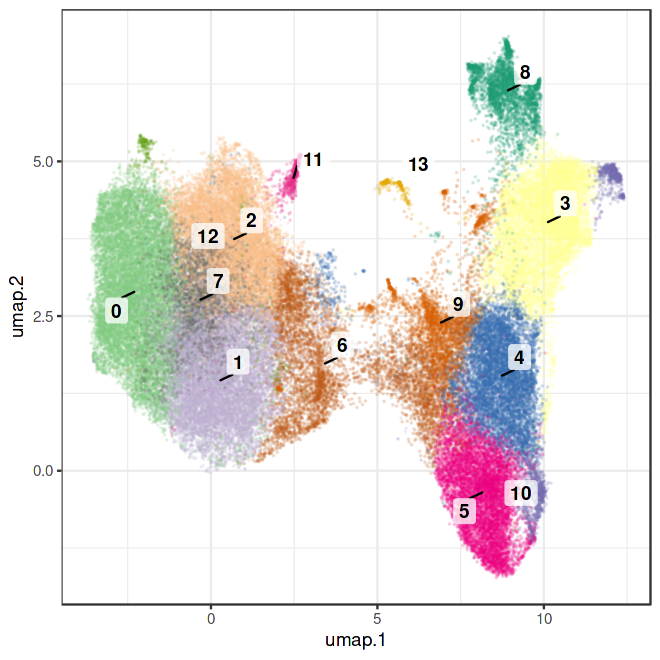

In [5]:
options(repr.plot.width=5.5, repr.plot.height=5.5)
scutility::plot_dimred(sce, dimred="umap", 
                       colour_by="leiden_scANVI_10", 
                       text_by="leiden_scANVI_10", 
                       scale_color=scale_color_manual(values=scutility::colors_get_distinct()),
                       point_size=0.025, point_alpha=0.15, 
                       shuffle=TRUE) + 
    theme(legend.position="none")

In [9]:
sce$lesion <- "Lesional"
sce$lesion[grepl("HC", sce$run)] <- "Healthy"

In [10]:
sce$lesional <- sce$lesion
sce$lesional[!sce$lesional %in% c("Healthy", "Non-lesional")] <- "Lesional"

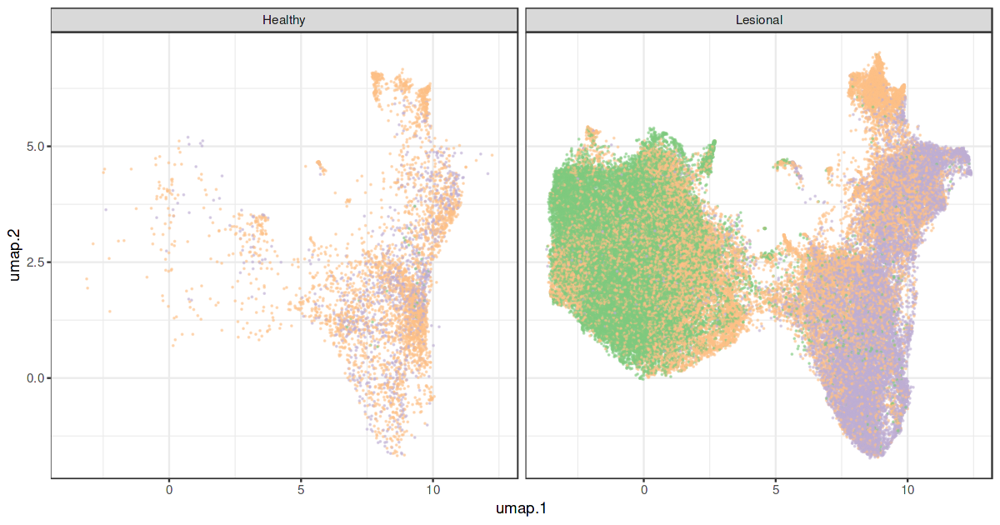

In [12]:
options(repr.plot.width=2*5, repr.plot.height=5.25)
scutility::plot_dimred(sce, dimred="umap", 
                       colour_by="Malignant", 
                       #text_by="leiden_scANVI_10", 
                       scale_color=scale_color_manual(values=scutility::colors_get_distinct()),
                       point_size=0.015, point_alpha=0.5, 
                       shuffle=TRUE) + 
    theme(legend.position="none") + 
    facet_wrap(~ lesional)

In [13]:
# From https://www.sciencedirect.com/science/article/pii/S107476132030409X
gating_single <- list()
gating_single$T_cell <- c("CD3D", "CD3E", "CD2", "TRAC")

## https://www.sciencedirect.com/science/article/pii/S2211124721009554
gating_single$ILC <- c("KLRB1", "IL7R", "KIT")
gating_single$NK <- c("KLRB1", "KLRD1", "GZMA")
gating_single$Tgd <- c("TRDC", "TRGC1", "TRGC2", "KLRD1")
gating_single$Tcell <- c("CD4", "CD8A", "KIR3DL2", "TOX")
gating_single$Cytokines <- c("IFNG", "IL17A", "IL13", "IL10")
gating_single$TF <- c("GATA3", "TBX21", "RORC", "FOXP3")

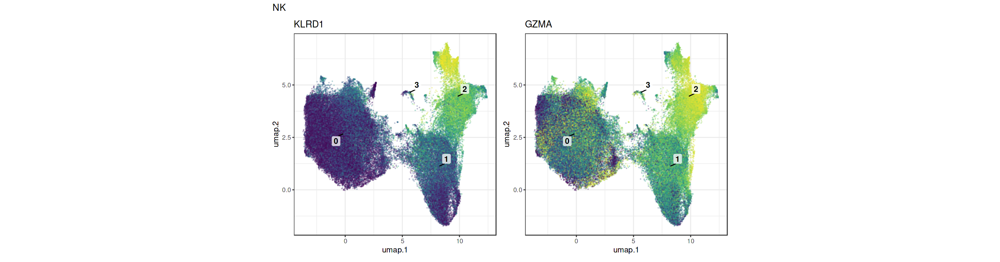

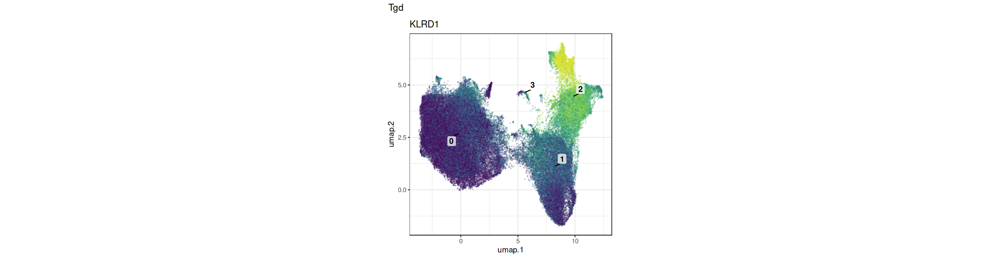

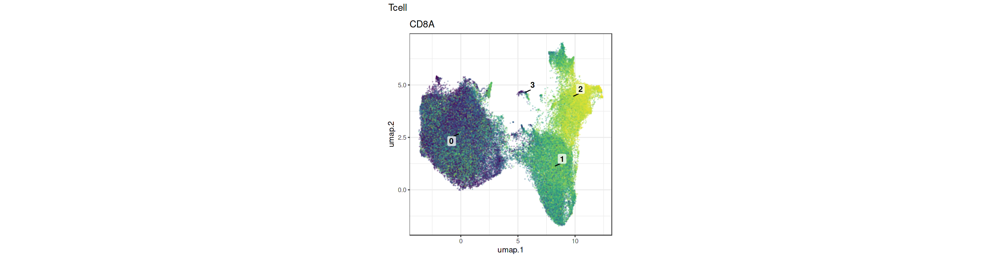

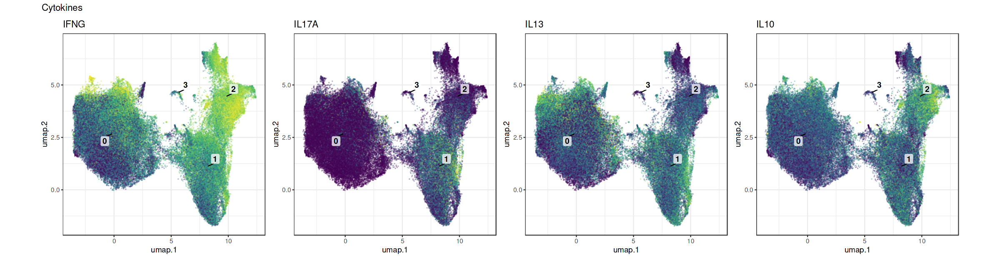

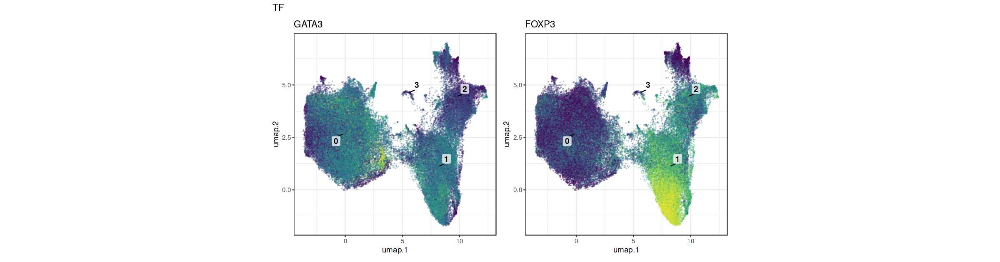

In [14]:
options(repr.plot.width=4*5, repr.plot.height=5.25)
iwalk(gating_single, function(markers, celltype){
    
    markers %<>% intersect(gsub("VI_", "", rownames(altExp(sce, "VI_RNA"))))
    
    if(length(markers) > 0){
        plots <- map(markers, function(marker){
        scutility::plot_dimred(sce, dimred="umap", 
                               colour_by=paste0("VI_", marker), text_by="leiden_scANVI_02", 
                               #colour_by=marker, text_by="leiden_scANVI_02", 
                               scale_color=scale_color_viridis_c(trans="log1p"),
                               min.cutoff='q5', max.cutoff='q99.9',
                               point_size=0.015, point_alpha=0.25, shuffle=TRUE) + 
            theme(legend.position="none", aspect.ratio=1) + 
            ggtitle(marker)
        })
        print(wrap_plots(plots, nrow=1) + patchwork::plot_annotation(title=celltype))
    }

})

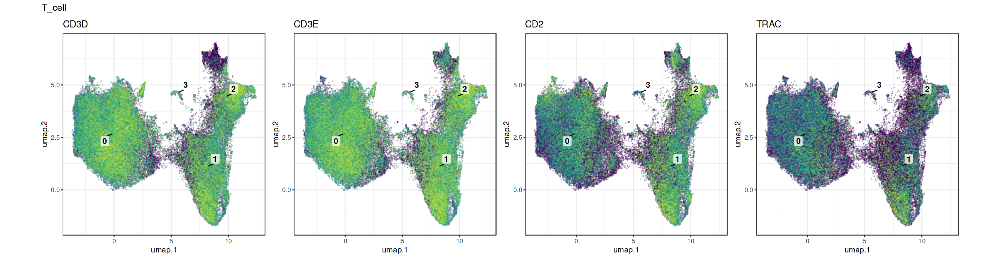

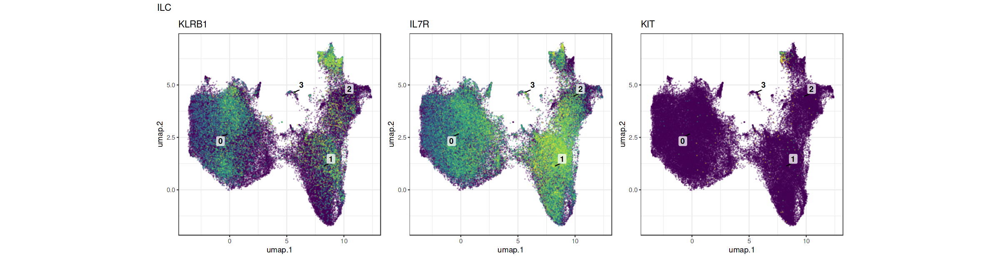

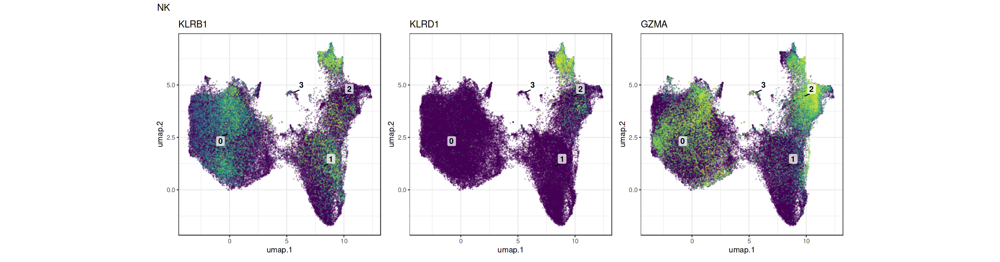

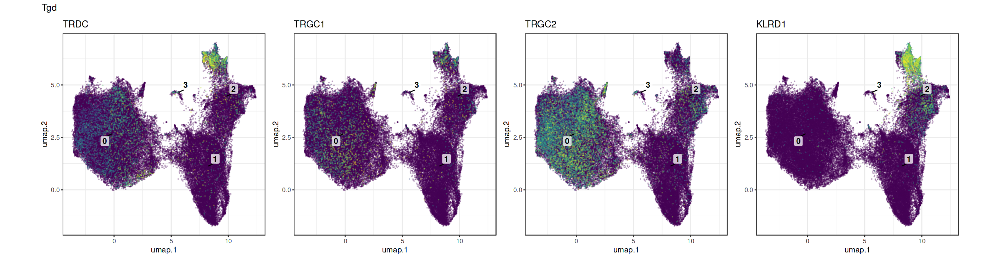

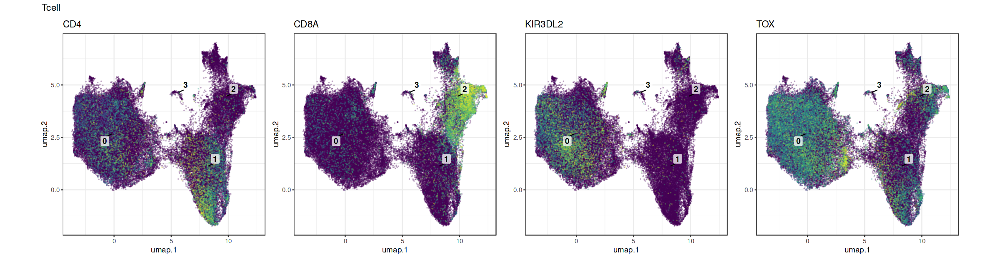

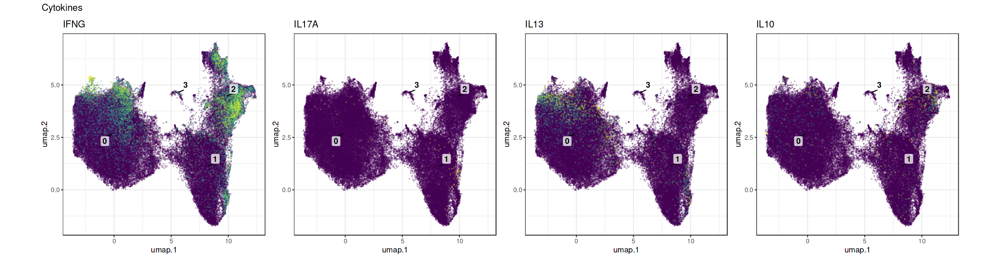

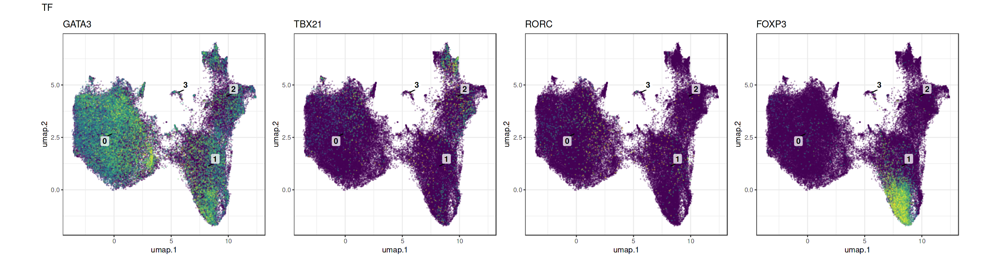

In [15]:
options(repr.plot.width=4*5, repr.plot.height=5.25)
iwalk(gating_single, function(markers, celltype){
    
    #markers %<>% intersect(gsub("VI_", "", rownames(altExp(sce, "VI_RNA"))))
    
    if(length(markers) > 0){
        plots <- map(markers, function(marker){
            scutility::plot_dimred(sce, dimred="umap", 
                               #colour_by=paste0("VI_", marker), text_by="leiden_scANVI_02", 
                               colour_by=marker, text_by="leiden_scANVI_02", 
                               scale_color=scale_color_viridis_c(trans="log1p"),
                               min.cutoff='q1', max.cutoff='q99.9',
                               point_size=0.015, point_alpha=0.25, order=TRUE) + 
            theme(legend.position="none", aspect.ratio=1) + 
            ggtitle(marker)
        })
        print(wrap_plots(plots, nrow=1) + patchwork::plot_annotation(title=celltype))
    }

})

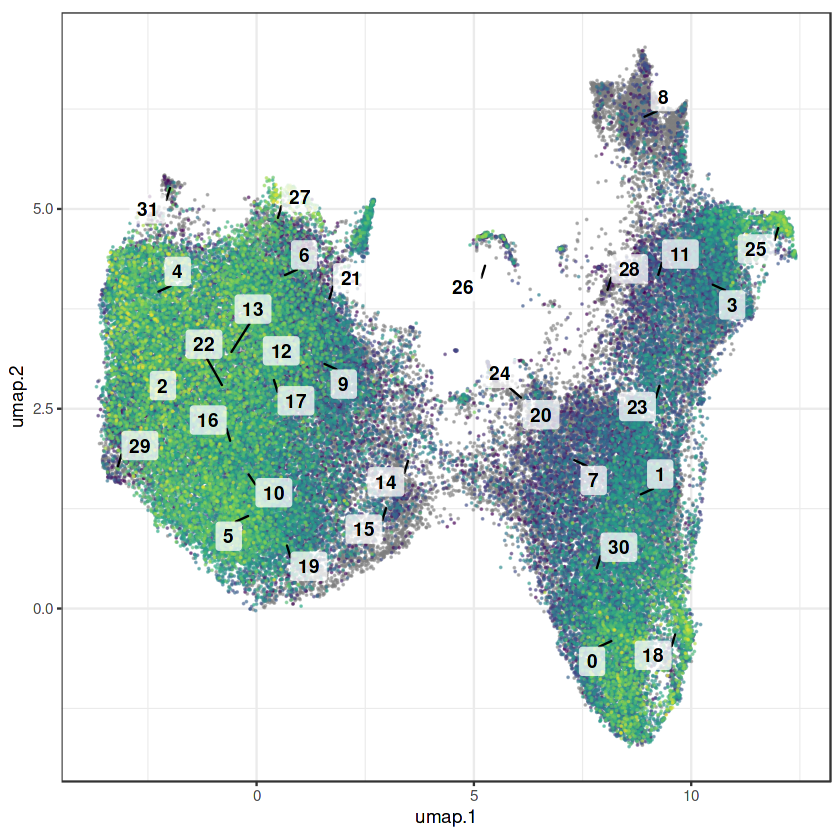

In [16]:
options(repr.plot.width=7, repr.plot.height=7)
scutility::plot_dimred(sce, dimred="umap", 
                               colour_by="TRB.1.umis", text_by="leiden_scANVI_20", 
                               scale_color=scale_color_viridis_c(trans="log1p"),
                               min.cutoff='q1', max.cutoff='q99.9',
                               point_size=0.025, point_alpha=0.5, order=TRUE) + 
            theme(legend.position="none", aspect.ratio=1)

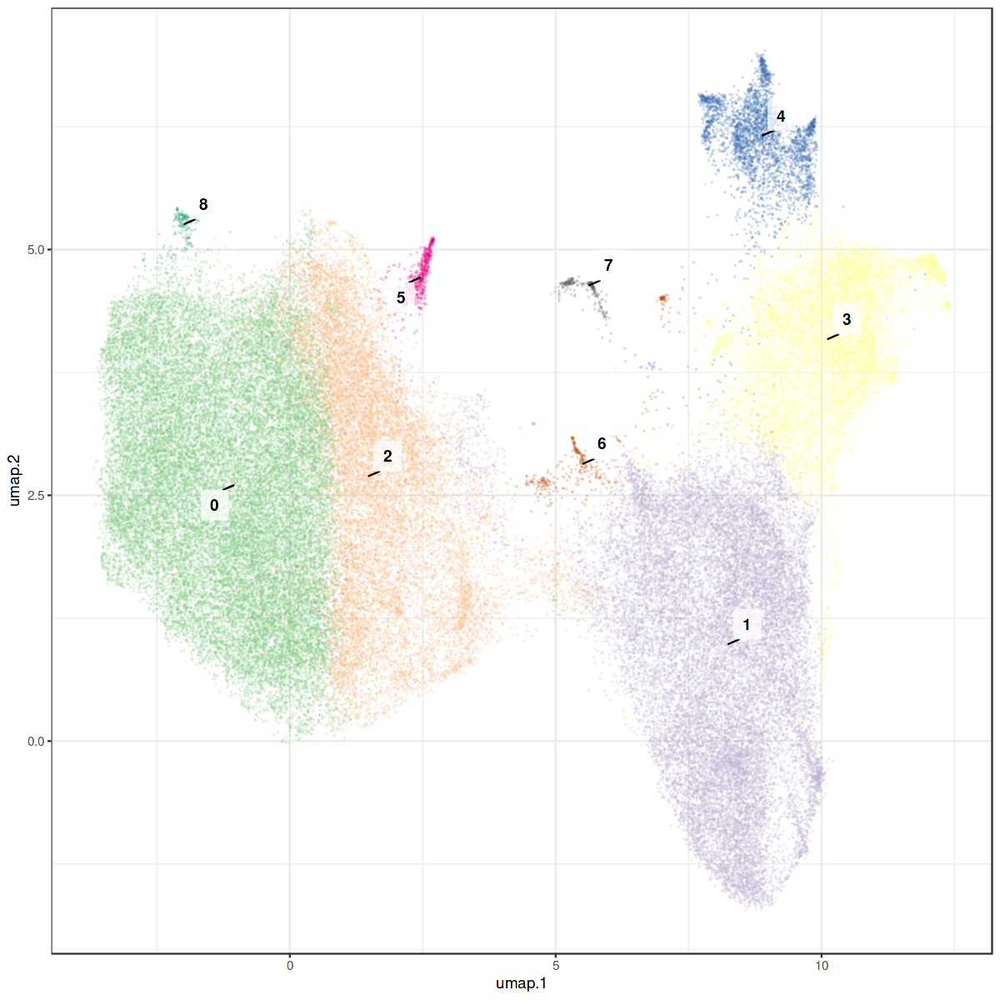

In [17]:
options(repr.plot.width=10, repr.plot.height=10)
scutility::plot_dimred(sce, dimred="umap", 
                       colour_by="leiden_scANVI_05", 
                       text_by="leiden_scANVI_05", 
                       scale_color=scale_color_manual(values=scutility::colors_get_distinct()),
                       point_size=0.025, point_alpha=0.15, 
                       shuffle=TRUE) + 
    theme(legend.position="none")

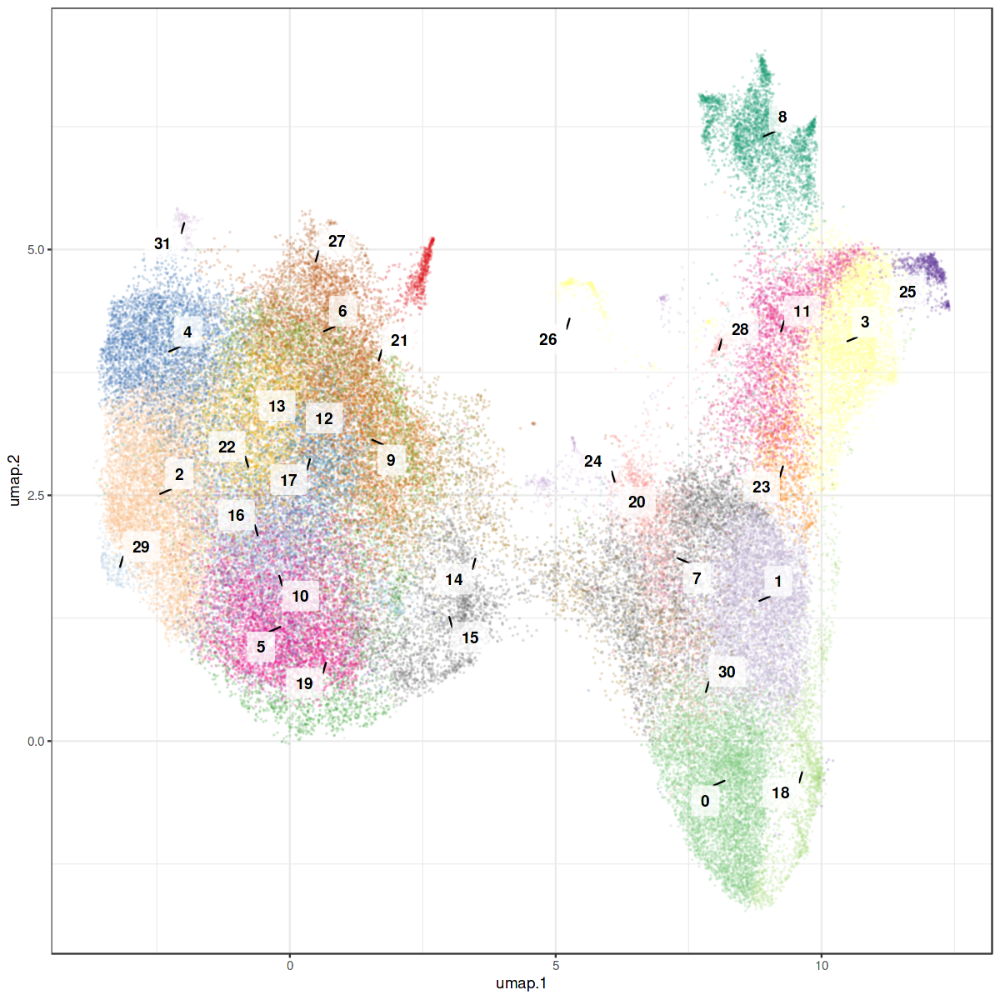

In [18]:
options(repr.plot.width=10, repr.plot.height=10)
scutility::plot_dimred(sce, dimred="umap", 
                       colour_by="leiden_scANVI_20", 
                       text_by="leiden_scANVI_20", 
                       scale_color=scale_color_manual(values=scutility::colors_get_distinct()),
                       point_size=0.025, point_alpha=0.15, 
                       shuffle=TRUE) + 
    theme(legend.position="none")

In [23]:
sce$cell_type.2 <- "T.Malignant"
sce$cell_type.2[reducedDim(sce, "umap")[,1] > 4.5] <- "T.CD4"
sce$cell_type.2[sce$leiden_scANVI_05 %in% c("3", "7")] <- "T.CD8"
sce$cell_type.2[sce$leiden_scANVI_20 %in% c("0")] <- "T.CD4.Treg"
sce$cell_type.2[sce$leiden_scANVI_05 %in% c("4")] <- "ILC1"

sce$cell_type.2[sce$Malignant == "Malignant"] <- "T.Malignant"
sce$cell_type.2[sce$cell_type.2 == "T.Malignant" & (sce$Malignant == "T cell" | sce$lesion == "Healthy")] <- "T.CD4"
sce$cell_type.2[sce$cell_type.2 %in% c("ILC1") & sce$Malignant == "T cell"] <- "T.CD8"

sce$cell_type.2[reducedDim(sce, "umap")[,1] > 9.3 & sce$cell_type.2 == "ILC1"] <- "NK"
sce$cell_type.2[reducedDim(sce, "umap")[,1] <= 8.3 & sce$cell_type.2 == "ILC1"] <- "ILC2"

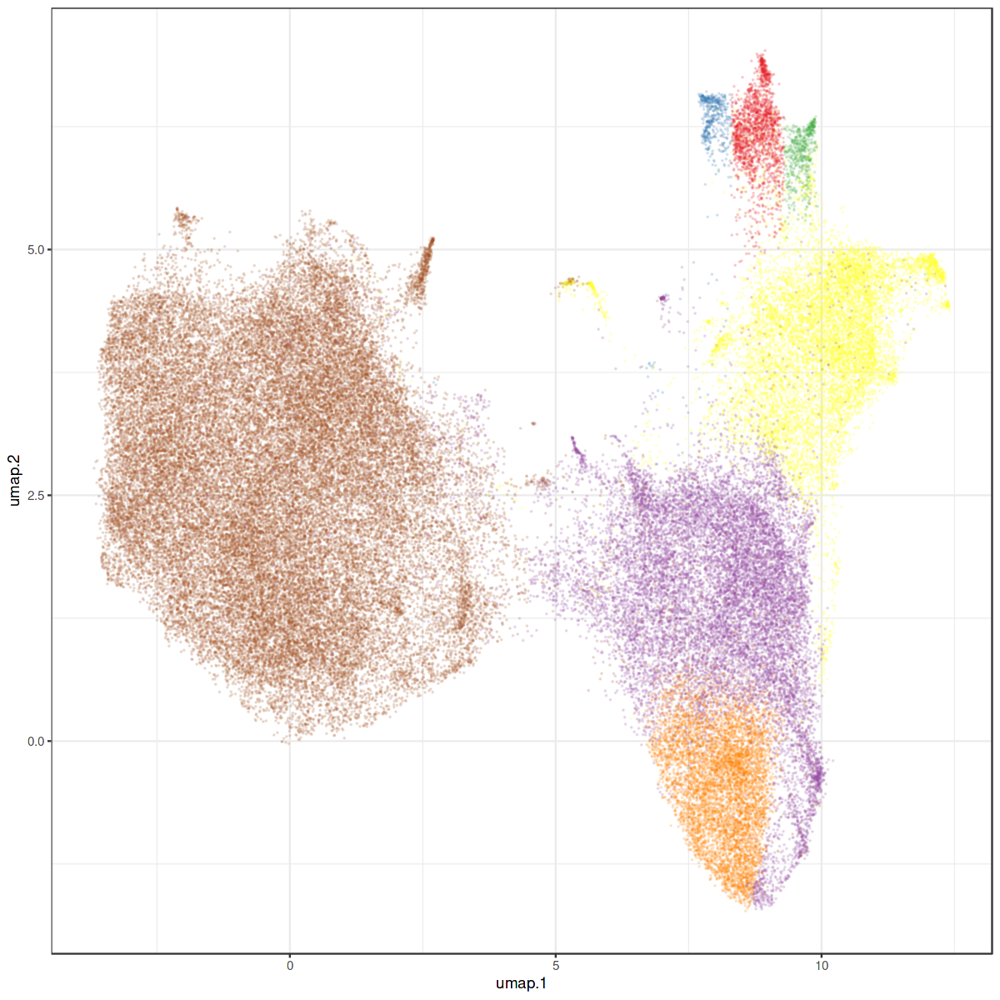

In [24]:
options(repr.plot.width=10, repr.plot.height=10)
scutility::plot_dimred(sce, dimred="umap", 
                       colour_by="cell_type.2", 
                       #text_by="cell_type.2", 
                       #scale_color=scale_color_manual(values=scutility::colors_get_distinct()),
                       point_size=0.025, point_alpha=0.15, 
                       shuffle=TRUE) + 
    theme(legend.position="none")

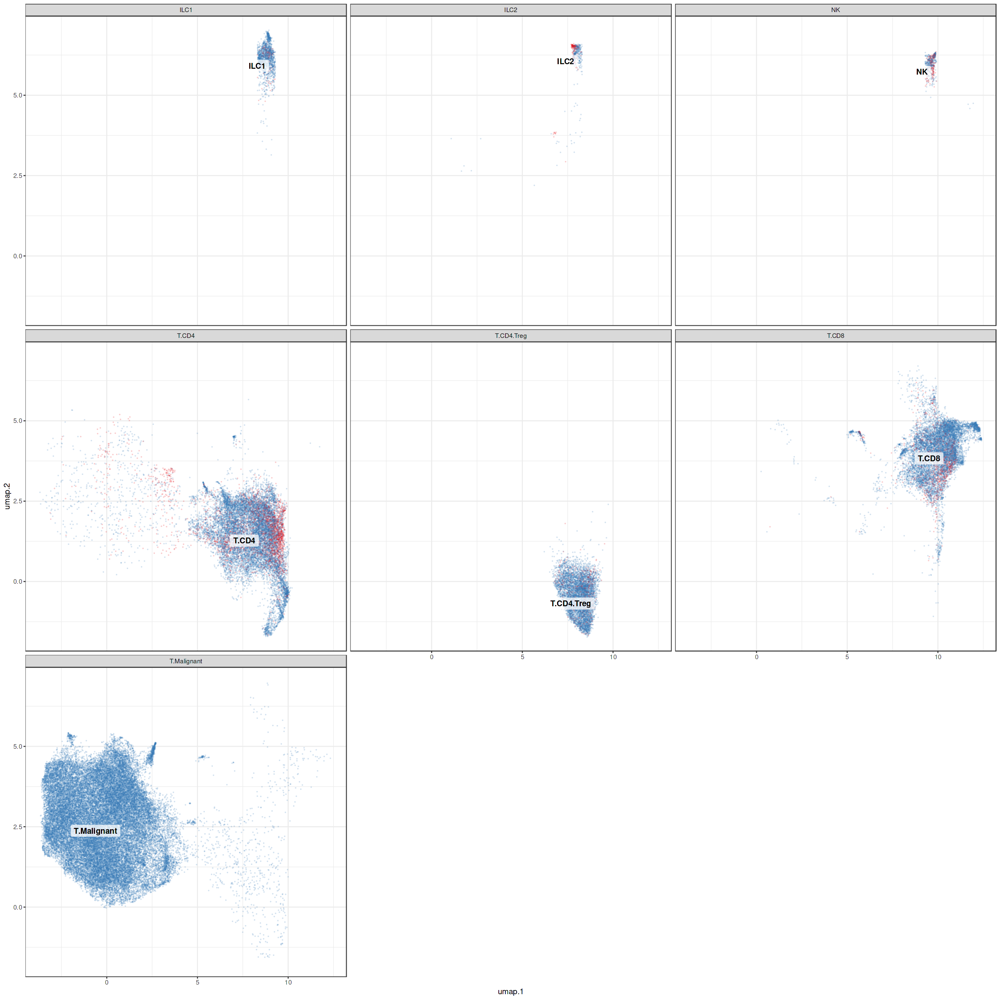

In [25]:
options(repr.plot.width=20, repr.plot.height=20)
scutility::plot_dimred(sce, dimred="umap", 
                       colour_by="lesional", 
                       text_by="cell_type.2", 
                       #scale_color=scale_color_manual(values=scutility::colors_get_distinct()),
                       point_size=0.025, point_alpha=0.15, 
                       shuffle=TRUE) + 
    theme(legend.position="none") + facet_wrap(~cell_type.2)

In [26]:
multisce_save(sce, path=here::here("data", "multisce", "skin_Tcells"), main_name="RNA")

Creating directory:  /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/sce

Saving VI_RNA to /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/sce/VI_RNA.rds

Creating directory:  /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/reducedDim

Saving scANVI to /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/reducedDim/scANVI.rds

Saving umap to /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/reducedDim/umap.rds

Saving scVI to /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/reducedDim/scVI.rds

Saving coldata to /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/coldata.rds

Saving RNA to /home/tbb/git/CTCL_KC_HLAII/data/multisce/skin_Tcells/sce/RNA.rds



`summarise()` has grouped output by 'study', 'donor', 'lesional', 'sample', 'cell_type.2', 'cell_type_count'. You can override using the `.groups` argument.


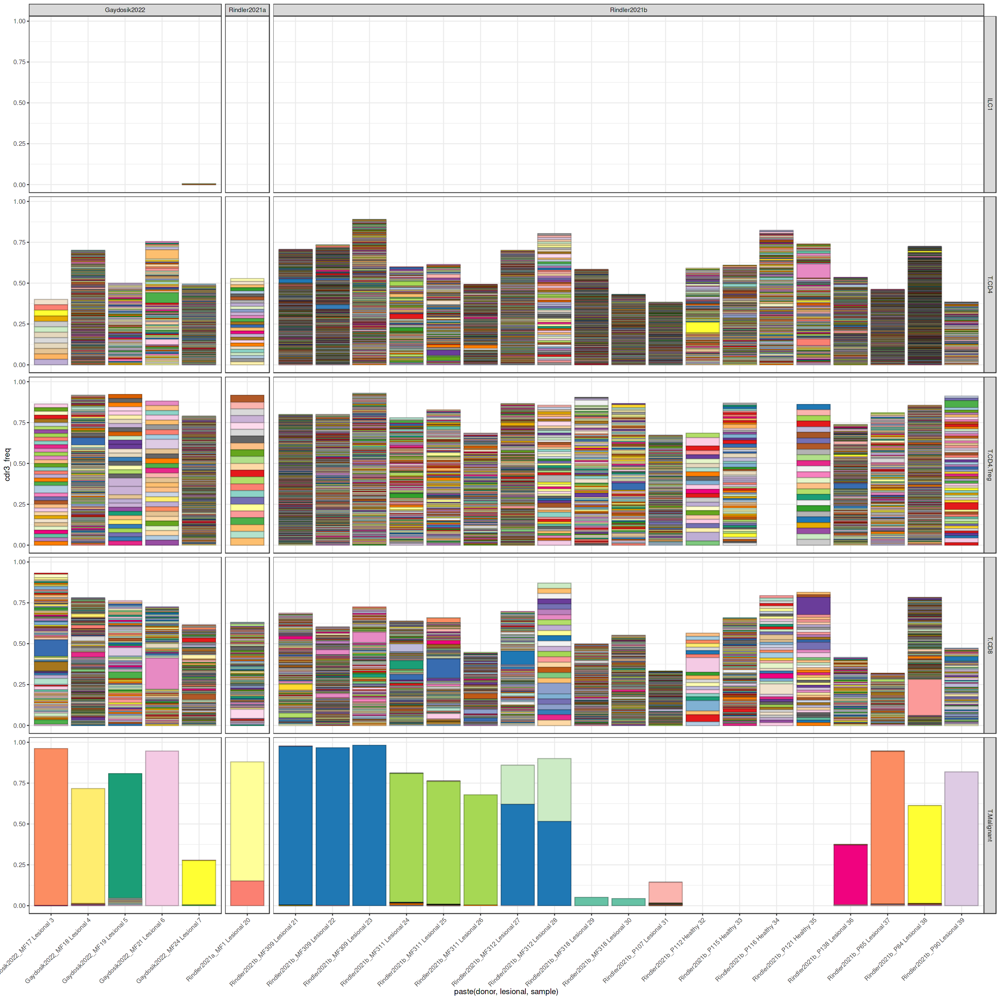

In [27]:
data_plot <- colData(sce)[,c("study", "lesional", "donor", "sample", "cell_type.2", "TRB.1.cdr3")] %>% as.data.frame() %>% 
    mutate(cdr3=TRB.1.cdr3) %>% 
    group_by(study, donor, lesional, sample, cell_type.2) %>% mutate(cell_type_count=n()) %>% 
    filter(!is.na(cdr3) & cdr3 != "None" & cell_type_count > 10) %>% 
    group_by(study, donor, lesional, sample, cell_type.2, cell_type_count, cdr3) %>% summarize(cdr3_count=n()) %>% 
    mutate(cdr3_freq=cdr3_count/cell_type_count)    

options(repr.plot.width=20, repr.plot.height=20)
data_plot %>% ggplot(aes(x=paste(donor, lesional, sample), y=cdr3_freq, fill=cdr3)) + 
    geom_col(color=alpha("black",0.25)) + 
    scale_fill_manual(values=rep(scutility::colors_get_distinct(), 1000)) + 
    facet_grid(rows=vars(cell_type.2), cols=vars(study), space="free_x", scales="free_x") + 
    theme(legend.position="none", axis.text.x=element_text(angle=45, hjust=1))

`summarise()` has grouped output by 'study', 'donor', 'lesional', 'sample', 'cell_type.2', 'cell_type_count'. You can override using the `.groups` argument.


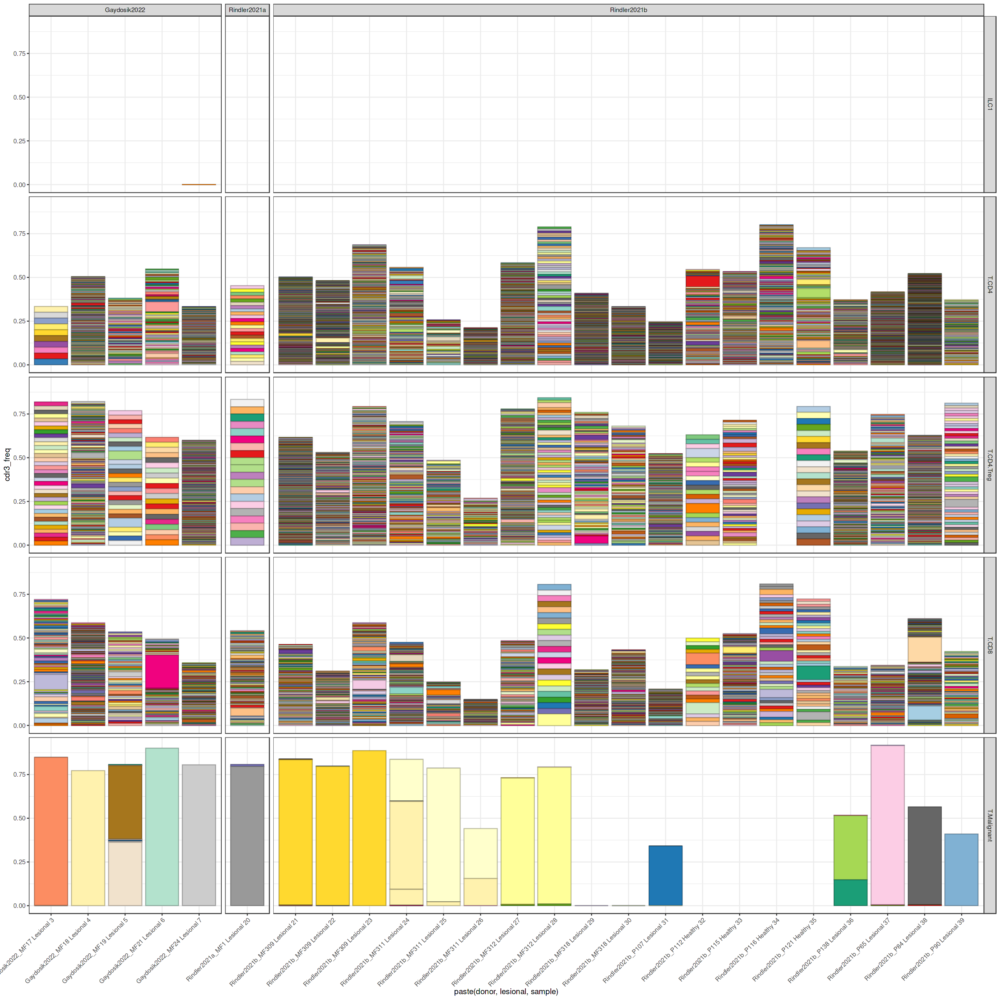

In [28]:
data_plot <- colData(sce)[,c("study", "lesional", "donor", "sample", "cell_type.2", "TRA.1.cdr3")] %>% as.data.frame() %>% 
    mutate(cdr3=TRA.1.cdr3) %>% 
    group_by(study, donor, lesional, sample, cell_type.2) %>% mutate(cell_type_count=n()) %>% 
    filter(!is.na(cdr3) & cdr3 != "None" & cell_type_count > 10) %>% 
    group_by(study, donor, lesional, sample, cell_type.2, cell_type_count, cdr3) %>% summarize(cdr3_count=n()) %>% 
    mutate(cdr3_freq=cdr3_count/cell_type_count)    

options(repr.plot.width=20, repr.plot.height=20)
data_plot %>% ggplot(aes(x=paste(donor, lesional, sample), y=cdr3_freq, fill=cdr3)) + 
    geom_col(color=alpha("black",0.25)) + 
    scale_fill_manual(values=rep(scutility::colors_get_distinct(), 1000)) + 
    facet_grid(rows=vars(cell_type.2), cols=vars(study), space="free_x", scales="free_x") + 
    theme(legend.position="none", axis.text.x=element_text(angle=45, hjust=1))